# 🐶 End-to-end Multi-class Dog Breed Classification

Using Tesnsorflow 2.0 and Tensorflow Hub

## 1. Problem statement
Predict dog breeds given image of Dog

## 2. Data
Unstrcutured Data
Using Kaggle's Dog breed indentification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

A file with preciciton probabilities for each dog breed of each test images

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

* Unstrcutured Data so using deep learning/transfer learning
* There are 120 breeds ~ classes
* 10000+ training and test set with no labels.




# Getting our work space ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we are using a GPU ✅

In [ ]:
#Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF HUB version:", hub.__version__)

#Check for GPU availability
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

TF version: 2.12.0
TF HUB version: 0.14.0
GPU Available


## Getting our data ready (Turning into Tensors)


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.value_counts()

id                                breed                     
000bec180eb18c7604dcecc8fe0dba07  boston_bull                   1
ab3aec7ac57f86ba1298d43d6fd3613d  malamute                      1
ab15179d96c2fbc0c16c46683f92f001  cardigan                      1
ab16b0a2feea44546a293be0cf233261  ibizan_hound                  1
ab1715c4f68734a7fecb8901e9baf72a  irish_terrier                 1
                                                               ..
54c60fe48c432816a32b860a32bd9be3  miniature_poodle              1
54d4876e394145a19762cbe38b44b3d4  silky_terrier                 1
54e13fffdce2fc4807122c9b8861bf94  redbone                       1
54e86ccdccd89c2b15d712c61b9460a9  greater_swiss_mountain_dog    1
fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever      1
Length: 10222, dtype: int64

<Axes: >

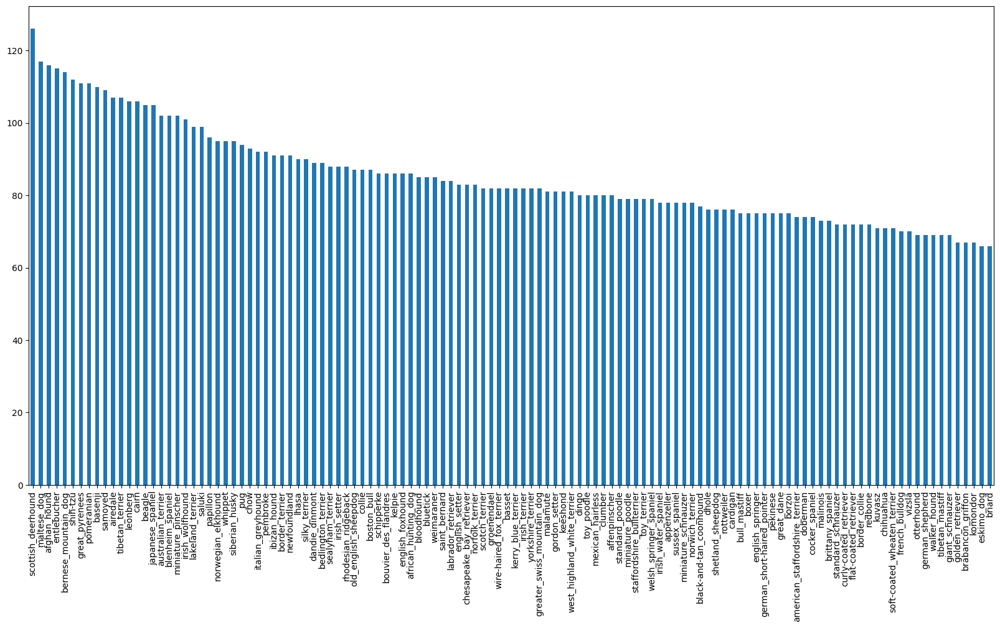

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
from numpy import median
# Median number of images per class
labels_csv["breed"].value_counts().median()

82.0

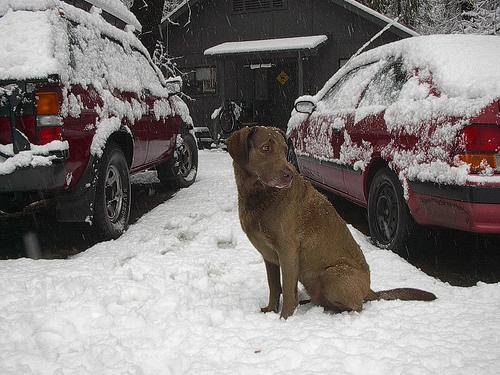

In [ ]:
#View an Image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/dog-breed-identification/train/fff43b07992508bc822f33d8ffd902ae.jpg")

### Getting Images and their labels
Get list of all image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from Image ID's
filenames = ["drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames donot match actual amount of files, check target")

Filenames match actual amount of files


In [ ]:
len(filenames)

10222

In [ ]:
len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/"))

10222

In [ ]:
#Debugging difference / it didnt have same number of files
import numpy as np
first_list = np.array(filenames)
second_list = np.array(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/"))

difference = np.setdiff1d(first_list, second_list)

print(list(difference))
len(difference)

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg', 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg', 'drive/MyDrive/Dog Vision/dog-breed-ide

10222

In [ ]:
os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")[:10]

['e57c7aad6b6851575b78e7a692df7ca3.jpg',
 'de8c32b71a43eef41eb1af93c1baf150.jpg',
 'e748f61d39da506904f531c7732df512.jpg',
 'e95bd9ab625ad1c16b513a13a27c447d.jpg',
 'db84277a5adca6b4a349396f6070287f.jpg',
 'e5d7f92c5a70ddd58cf5dd32d573bd2b.jpg',
 'dc1c430fe26e231d4c8e13d2ee14c5ad.jpg',
 'e8f5dd1ad67209c064965691030a07e5.jpg',
 'e07e46622e95d95ed698113415aaeda6.jpg',
 'dbe9a2868d227a12197fb6c44b93d85a.jpg']

In [ ]:
filenames_temp = [fname + ".jpg" for fname in labels_csv["id"]]
filenames_temp[:10]

['000bec180eb18c7604dcecc8fe0dba07.jpg',
 '001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '001cdf01b096e06d78e9e5112d419397.jpg',
 '00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '002211c81b498ef88e1b40b9abf84e1d.jpg',
 '00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '002a283a315af96eaea0e28e7163b21b.jpg',
 '003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:

import numpy as np
first_list = np.array(filenames_temp)
second_list = np.array(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/"))

difference = np.setdiff1d(first_list, second_list)

print(list(difference))
len(difference)

[]


0

In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames donot match actual amount of files, check target")

Filenames match actual amount of files


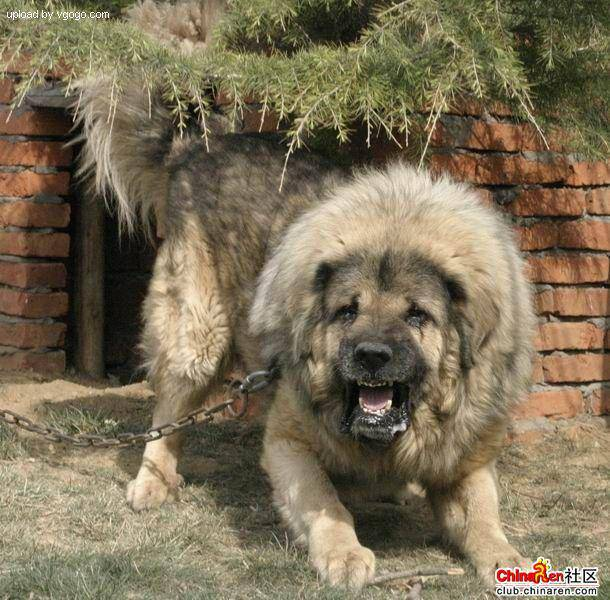

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"]
lables = np.array(labels)
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
if len(lables)==len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("it doesnt")

Number of labels matches number of filenames


In [ ]:
unique_breeds = np.unique(labels)
unique_breeds
#len(unique_breeds)  #120

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean Array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) #Index where label occurs in bollean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [ ]:
#Setup X and y Variables
X = filenames
y = boolean_labels

### Starting with ~1000 images and increase later as needed

In [ ]:
#Set no of images
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000,step:1000}

In [ ]:
#Split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train) , len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

## Preprocessing Images or Turn Images into Tensors

Write a function to do these:
1. Image filepath as input
2. Use Tensorflow to read the file and save it to a vaibale `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert colour channel values from 0-255 to 0-1)
5. Resize the `image` to be shape of (224,224)
6. Return the modified `image`


In [ ]:
# Convert image to NumPy
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()  #colour channel

(255, 0)

In [ ]:
# Convert Image into Tensor - runs on GPU
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 224

#preprocessing image funtion
def process_image(image_path):
  """
  Takes an image file path and turns the image to tensor
  """

  #Read image file
  image = tf.io.read_file(image_path)
  #Turn jpeg into tensor with 3 colour channels red green blue
  image = tf.image.decode_jpeg(image,channels=3)
  #Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize image (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
#tensor = tf.io.read_file(filenames[26])
#tensor

In [ ]:
#tensor = tf.image.decode_jpeg(tensor,channels=3)

In [ ]:
#tf.image.convert_image_dtype(tensor, tf.float32)

## Turning our data into batches

<=32
Tensor Tuples
`(image, label)`

In [ ]:
#Create a function to return a tuple of tensors
def get_image_label(image_path, label):
  """
  """
  image = process_image(image_path)
  return image,label


In [ ]:
#Demo of the above
(process_image(X[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

## Function to turn all data (`X` and `y`) into batches


In [ ]:
BATCH_SIZE =32

# Function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs
  Shuffles the data if it's training data but doesnt shuffle if its validation data.
  Also accepts tets data as input(non labels)
  """
  # If test dataset , No labels
  if test_data:
    print("Creating tets data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("creating training data batches...")
    #Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #Shuffling pathnames and labels before image processor function
    data = data.shuffle(buffer_size=len(X))
    #Create (image,label) tupples
    data = data.map(get_image_label)

    #Turn train data to batches
    data_batch = data.batch(BATCH_SIZE)
  return  data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches



In [ ]:
import matplotlib.pyplot as plt

# Create a func for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop 25
  for i in range(25):
    # Create subplots ( 5 rows 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

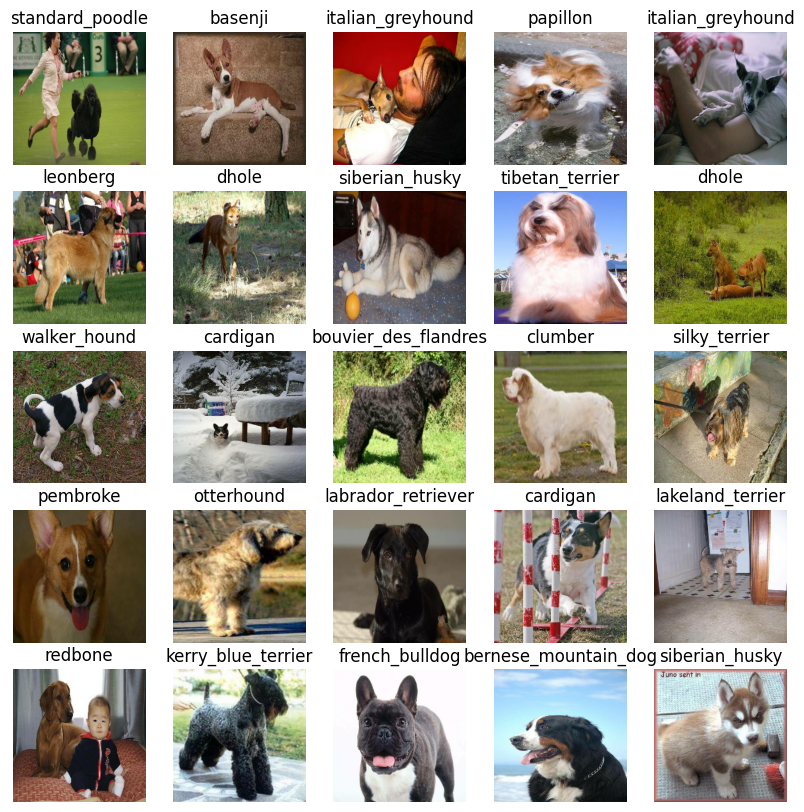

In [ ]:
#Visualize data inthe training batch
show_25_images(train_images, train_labels)

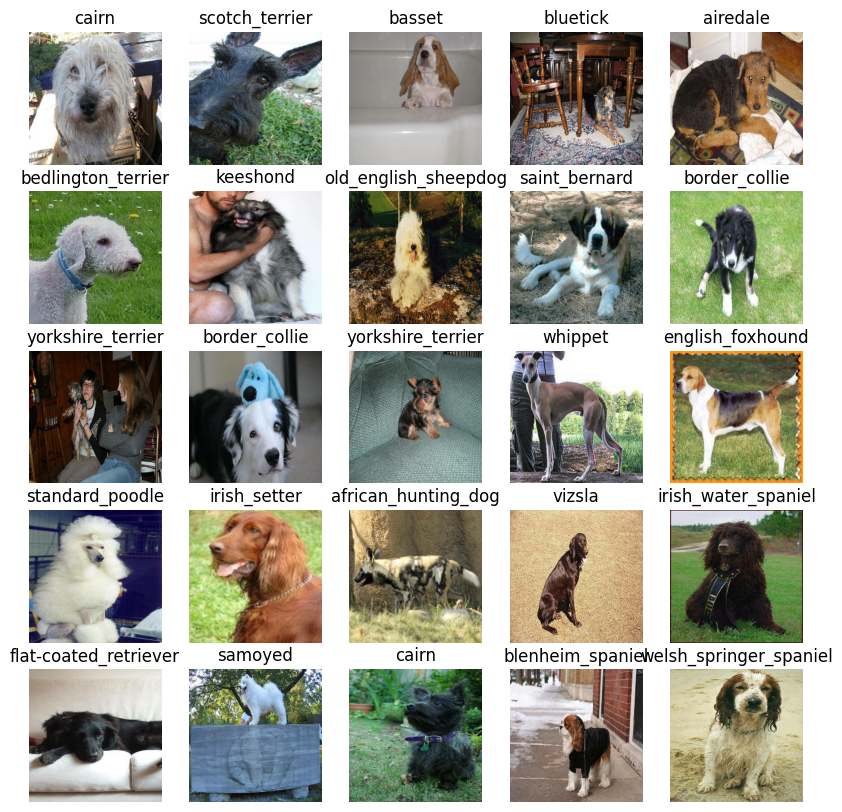

In [ ]:
#Visualize data in the validation state
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

But first define:
* Input shape (our images shape , in the form of Tensors) to our model.
* Output shape (image labels , in the form of Tensors)
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

# Setup output shape pf our model
OUTPUT_SHAPE = len(unique_breeds)  #120

#Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

## Putting inputs,outputs,model into a KERAS deep learning model !

Create function to :
* Takes the input shape ,output shape and the model as parameters
* Defines layers in Kera model in sequential fashion
* Compiles the model
* Builds the model
* Returns the model

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") #Layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

-Helper functions a model can use during training such as save its progress, check the same , stop training early if model starts improving.

### TENSORBOARD CALLBACK
- helps track our models progress

1. ✅ Load Tensorboard Notebook extension
2. ✅ Create callback to save logs to a dir and pass it to our model's `fit()` function.
3. ✅ Visualize our models training logs with `%tensorboard` magic function

In [ ]:
#Load TensorBoard notebook extension
%load_ext tensorboard

import datetime
#Create function to buils callback
def create_tensorboard_callback():
  #create log dir
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        #get it tracked
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early stopping callback
-Stop training when model has started improving to avoid overfitting




In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## TRaining a Model (On a subset of data)

First model is going to train on 1000 images.

In [ ]:
#No of epochs : how many passes of data we want to do
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
#Check GPU
print("GPU", "available (YESS)" if tf.config.list_physical_devices("GPU")else "not available")

GPU available (YESS)


Function to train a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call `fit()` function on our model passing it the training data , validation data
  , epochs number to train for (`NUM_EPOCHS`) and callbacks
* Return the model

In [ ]:
#Fucntion to traina nd return a model
def train_model():
  """
  trians a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 190s 7s/step - loss: 4.4390 - accuracy: 0.1112 - val_loss: 3.3070 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 170ms/step - loss: 1.5766 - accuracy: 0.6837 - val_loss: 2.0754 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 3s 129ms/step - loss: 0.5482 - accuracy: 0.9388 - val_loss: 1.6374 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2499 - accuracy: 0.9875 - val_loss: 1.4507 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 3s 119ms/step - loss: 0.1442 - accuracy: 0.9975 - val_loss: 1.3714 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.0985 - accuracy: 1.0000 - val_loss: 1.3443 - val_accuracy: 0.6650
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard logs

The TensorBoard magic function `%tensorboard` will access the logs directory and visualize its contents


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make prediction on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 93ms/step


array([[2.30401391e-04, 7.84872973e-05, 4.56520735e-04, ...,
        2.29416706e-04, 6.27266345e-05, 4.18323511e-03],
       [6.54290384e-03, 3.89978581e-04, 1.90125555e-02, ...,
        9.03783075e-04, 7.52339198e-04, 1.00925055e-04],
       [8.57786654e-06, 3.16357764e-05, 1.93600572e-05, ...,
        2.88121053e-04, 1.49963398e-06, 1.06379346e-04],
       ...,
       [4.22367375e-05, 3.45466688e-05, 1.33044872e-04, ...,
        3.20820436e-05, 4.17163508e-04, 3.08908602e-05],
       [5.81232132e-03, 1.70302257e-04, 3.33723699e-04, ...,
        3.71820570e-05, 4.16452640e-05, 1.46202277e-02],
       [7.24003301e-04, 6.87899092e-06, 4.49703133e-04, ...,
        8.35640007e-04, 3.82704660e-04, 4.42887140e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
predictions[0]

array([2.30401391e-04, 7.84872973e-05, 4.56520735e-04, 4.48528190e-05,
       2.42570357e-04, 2.43318354e-05, 2.88344137e-02, 6.67836808e-04,
       3.43309512e-04, 9.35639837e-05, 1.87087731e-04, 2.32088219e-04,
       7.98479305e-04, 4.54155197e-05, 4.26451006e-04, 4.65436489e-04,
       7.60225230e-05, 1.50042206e-01, 8.86580892e-06, 4.35396032e-05,
       1.79588649e-04, 9.54839634e-05, 2.02767224e-05, 5.41739748e-04,
       1.39812153e-04, 4.89599188e-04, 2.00856134e-01, 2.68048840e-04,
       1.25497242e-03, 3.06052796e-04, 3.12964003e-05, 9.92073561e-04,
       2.25294585e-04, 2.21602422e-05, 1.14865165e-04, 5.35798911e-03,
       2.98625546e-05, 1.33528330e-04, 2.63040693e-05, 1.04068647e-04,
       1.25058892e-03, 1.13744291e-05, 8.08265249e-05, 2.23117691e-04,
       1.67931212e-05, 3.30977840e-04, 1.59285628e-05, 1.42591249e-04,
       8.73618992e-04, 1.74611021e-04, 2.76850405e-05, 2.93160469e-04,
       2.26899880e-04, 1.17777607e-04, 1.32674046e-04, 2.18352652e-05,
      

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
np.sum(predictions[1])

0.99999994

In [ ]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.30401391e-04 7.84872973e-05 4.56520735e-04 4.48528190e-05
 2.42570357e-04 2.43318354e-05 2.88344137e-02 6.67836808e-04
 3.43309512e-04 9.35639837e-05 1.87087731e-04 2.32088219e-04
 7.98479305e-04 4.54155197e-05 4.26451006e-04 4.65436489e-04
 7.60225230e-05 1.50042206e-01 8.86580892e-06 4.35396032e-05
 1.79588649e-04 9.54839634e-05 2.02767224e-05 5.41739748e-04
 1.39812153e-04 4.89599188e-04 2.00856134e-01 2.68048840e-04
 1.25497242e-03 3.06052796e-04 3.12964003e-05 9.92073561e-04
 2.25294585e-04 2.21602422e-05 1.14865165e-04 5.35798911e-03
 2.98625546e-05 1.33528330e-04 2.63040693e-05 1.04068647e-04
 1.25058892e-03 1.13744291e-05 8.08265249e-05 2.23117691e-04
 1.67931212e-05 3.30977840e-04 1.59285628e-05 1.42591249e-04
 8.73618992e-04 1.74611021e-04 2.76850405e-05 2.93160469e-04
 2.26899880e-04 1.17777607e-04 1.32674046e-04 2.18352652e-05
 5.86380542e-04 9.53350216e-04 3.11523385e-04 8.89795944e-02
 9.50095418e-05 7.37990340e-05 2.00512074e-03 4.03363883e-05
 9.82196885e-04 6.087785

In [ ]:
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.13762981e-04 3.61494385e-05 5.38012595e-04 6.97194191e-05
 2.85571953e-03 2.99750245e-05 8.81691667e-05 5.99391118e-04
 1.35242008e-02 9.06577408e-02 1.03526480e-04 2.10419171e-06
 9.77758435e-04 6.80634053e-03 3.75451200e-04 6.10314310e-03
 2.53671227e-04 1.31297522e-04 3.85779218e-04 7.61782285e-04
 8.66773989e-05 4.16340888e-04 4.25834005e-05 2.08016427e-05
 8.64526909e-03 1.34978662e-04 7.74792788e-05 3.66100030e-05
 3.61581479e-04 3.65556807e-05 7.34357673e-05 1.82113145e-04
 1.64487865e-05 2.85918159e-05 3.11205040e-05 3.71685855e-05
 8.78727587e-05 1.03313039e-04 5.87400464e-05 3.29197943e-01
 1.80827818e-04 2.87343701e-05 3.46768601e-03 6.61864306e-06
 2.21665061e-04 3.56558521e-05 2.61164125e-04 6.94943534e-04
 1.61543692e-04 3.14059784e-04 2.56707455e-04 2.13879626e-04
 2.75217957e-04 1.63805264e-03 1.92438802e-05 8.45650211e-04
 1.30805842e-04 9.75561197e-05 2.77055824e-05 2.46037467e-04
 3.22365013e-05 9.63715720e-04 1.61807875e-05 2.36416818e-05
 8.06582611e-05 7.294258

In [ ]:
# Turn Prediction Probabilities into respective label
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

#get predicted label
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

In [ ]:
# Unbatch the validation set
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0]

array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

In [ ]:
#Create a function to unbatch a batch dataset
def unbatchify(data):
  images = []
  labels = []
  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

#unbatchify the validation sets
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

## Visualize
* Prediction labels
* Validation labels (truth labels)
* Validation images

Make function to make these visual :

* takes an array of prediciton prob, an array of truth tables
* array or images and integers.
* Convert the prediciton prob to prdicted label
* plot the pred label , pred prob, the truth table and target image in a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  Vew the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probabilty of prediciton and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)


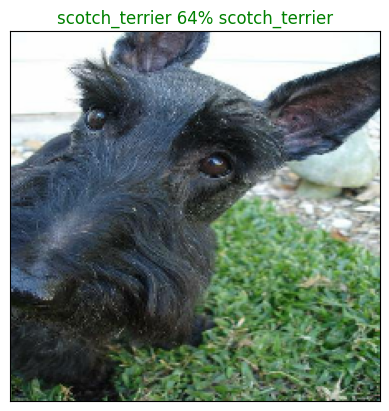

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

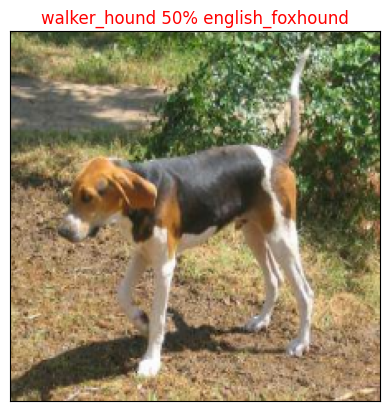

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

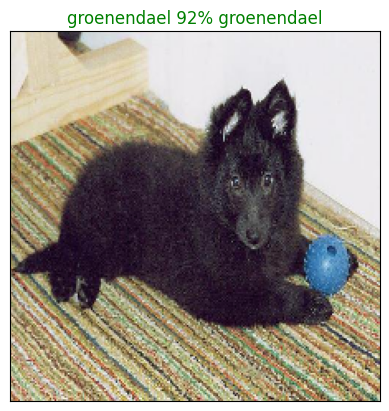

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

View our models top 10 predictions
This function will:
* Take an inout of prediction probabilities array and a ground truth array and integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilties indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find a top 10 prediction confidence values
  top_10_pred_values =  pred_prob[top_10_pred_indexes]

  # Fidn the top 10 prediciton labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Set Up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


In [ ]:
predictions[0].argsort()[-10:][::-1]

array([103,  26,  17,  59, 102,  70,   6,  79, 109,  77])

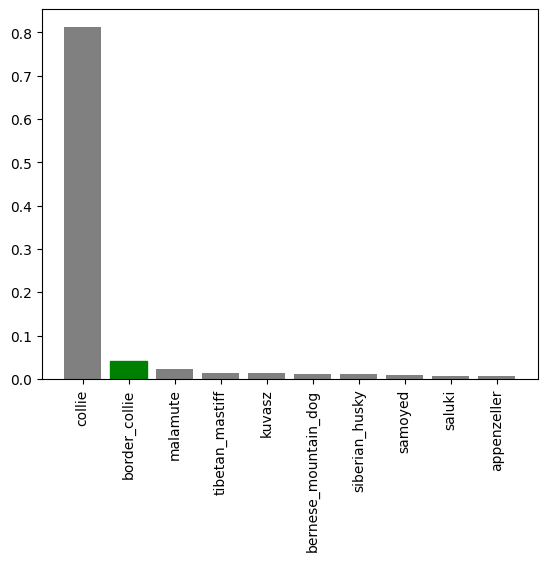

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Check out more than one image

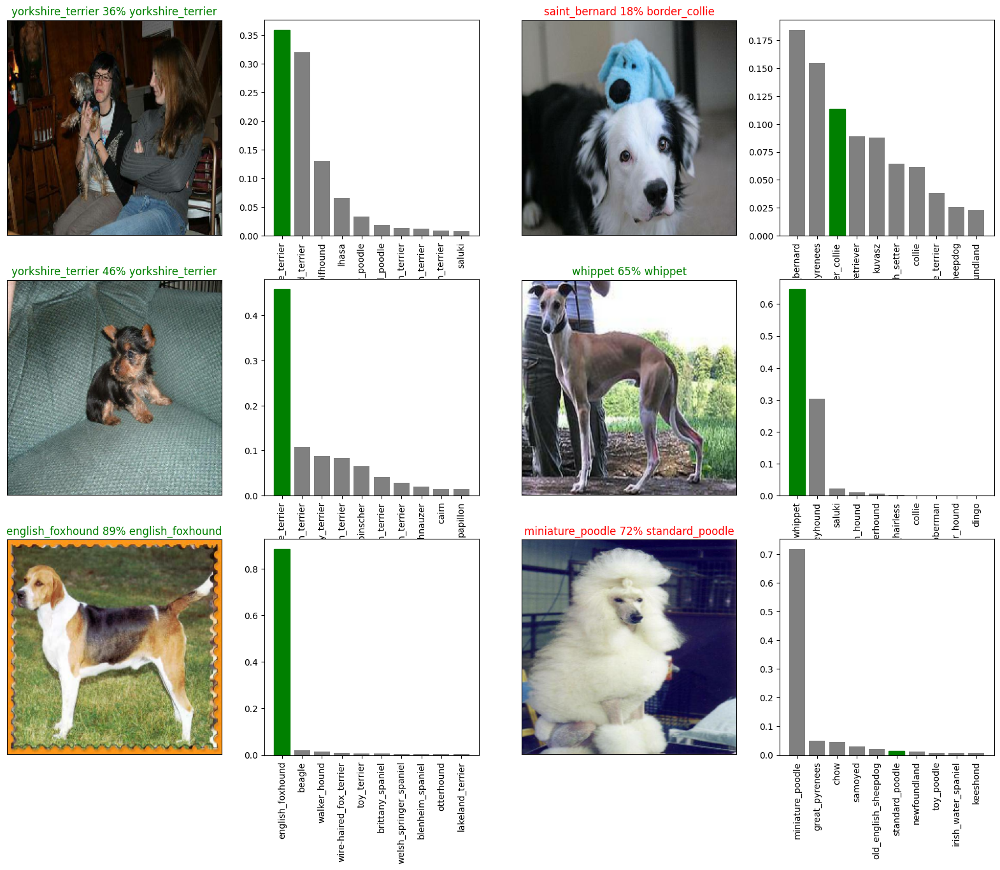

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout

plt.show()


## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in models dir, and appends a suffix (string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230902-06171693635464-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230902-06171693635464-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20230830-18461693421201-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20230830-18461693421201-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.2274 - accuracy: 0.6750


[1.2273690700531006, 0.675000011920929]

In [ ]:
# Evaluate  the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.2885 - accuracy: 0.6800


[1.288466453552246, 0.6800000071525574]

# Training a big dog model 🐶 (on full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)


creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No Validation set when training on all the da...
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


**NOTE** Following cell might take 30mins for each epoch .

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 138ms/step - loss: 1.3274 - accuracy: 0.6705
Epoch 2/100
320/320 [==============================] - 39s 122ms/step - loss: 0.3951 - accuracy: 0.8839
Epoch 3/100
320/320 [==============================] - 37s 115ms/step - loss: 0.2356 - accuracy: 0.9374
Epoch 4/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1515 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1050 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0764 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0586 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0477 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0371 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 37s 115m

In [ ]:
#Save Full model
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230902-06401693636829-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230902-06401693636829-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20230902-06401693636829-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20230902-06401693636829-full-image-set-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

## Making predictions on the test dataset

to make predicitons on the test data , we need to convert them to tensor batches like our train data

We shall use `create_data_batches()` to do the same for train data

To make predictions :
* Get the tets images filenames
* Convert the filenames into test data batches using
`create_data_batches()` and setting the `test_data` parmeter to `True` (sinc etets data doesnt have labels).
* make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load test images filenames
test_path = "/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e57fded38af2f081403feefb324ed3a9.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e47bc25097050ba689b64de02c725837.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e07106e5301fbce05cade5c94f775a72.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/dcdffa00518844bd21499db49979f9c8.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e4c49d7e028965d3504b0862633464c3.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e4ba350279796ff15c3a634037a6f88e.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/dfefaa03faeab447d6b48e7367255b43.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identific

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating tets data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE!** Following cell will take long time

In [ ]:
# Run predicitons on full data set
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 248s 721ms/step


In [ ]:
# Save predicitons to csv file
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.4436809e-12, 1.4138963e-11, 3.1999785e-12, ..., 7.8142701e-11,
        5.5300685e-16, 7.1813275e-08],
       [7.1069409e-13, 1.7504978e-11, 8.4805024e-11, ..., 9.9860471e-01,
        1.3679555e-13, 1.0339592e-12],
       [7.8080615e-07, 1.9643575e-07, 1.3809848e-09, ..., 8.1780733e-09,
        1.4743258e-05, 1.6882552e-06],
       ...,
       [2.0521298e-07, 7.9462525e-06, 4.2147428e-04, ..., 3.1057461e-06,
        1.4801381e-12, 3.3685041e-10],
       [3.0239837e-09, 3.7310827e-12, 6.1564807e-12, ..., 1.1029023e-11,
        7.6969545e-13, 1.2617813e-06],
       [4.7490650e-07, 3.2746816e-11, 1.3508771e-09, ..., 6.9496693e-08,
        4.9582471e-10, 4.6621196e-09]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions to Kaggle

* Create a Pandas DataFrame with an ID column and dog breed column
* Add data to ID column by extracting the test image ID's from their filepaths
* Add data  (the prediciton probabilities) to each of the dog breed columns
* Export the dataframe as a CSV to submit it to Kaggle


In [ ]:
# Create a pandas DataFrame with the empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e241bfdd5cc6154698394905abaa0d76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e57fded38af2f081403feefb324ed3a9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e47bc25097050ba689b64de02c725837,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e07106e5301fbce05cade5c94f775a72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dcdffa00518844bd21499db49979f9c8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediciton probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e241bfdd5cc6154698394905abaa0d76,1.443681e-12,1.413896e-11,3.199978e-12,6.511165e-13,4.376654e-13,1.022889e-13,3.433254e-11,1.042004e-12,1.582974e-13,...,7.700564e-11,2.049264e-12,5.956846e-12,1.177102e-13,6.970746e-15,1.036094e-14,3.582010e-15,7.814270e-11,5.530068e-16,7.181328e-08
1,e57fded38af2f081403feefb324ed3a9,7.106941e-13,1.750498e-11,8.480502e-11,2.727840e-14,4.044638e-06,6.663060e-09,1.221518e-10,1.204556e-08,1.951257e-12,...,9.475632e-12,2.469671e-08,3.118298e-11,4.798062e-08,4.466391e-10,3.002627e-14,1.323174e-15,9.986047e-01,1.367955e-13,1.033959e-12
2,e47bc25097050ba689b64de02c725837,7.808061e-07,1.964357e-07,1.380985e-09,5.745878e-09,5.737579e-12,2.767121e-10,2.189105e-08,4.292577e-09,2.267471e-10,...,7.370318e-08,1.095077e-09,1.719697e-12,2.244961e-09,2.615527e-11,1.588310e-08,1.191109e-08,8.178073e-09,1.474326e-05,1.688255e-06
3,e07106e5301fbce05cade5c94f775a72,3.377919e-09,3.328694e-07,1.451351e-10,4.840344e-05,6.991501e-10,4.746377e-10,7.952919e-09,4.975902e-08,3.396099e-12,...,4.559260e-08,5.953830e-08,2.119904e-09,6.476991e-07,8.925018e-11,5.529409e-08,9.380599e-08,4.384547e-08,9.993500e-01,4.915474e-08
4,dcdffa00518844bd21499db49979f9c8,2.879551e-11,3.693331e-13,4.618155e-14,9.837868e-12,8.439549e-07,5.423698e-05,8.957763e-10,9.998891e-01,2.739803e-09,...,1.829574e-09,1.687911e-09,4.793422e-09,1.997712e-12,1.124782e-12,9.637444e-10,1.048333e-11,2.025045e-09,1.454769e-08,5.638150e-13


In [ ]:
# Save our predicitons dataframe to CSV for submisison to Kaggle
# https://www.kaggle.com/competitions/dog-breed-identification/submissions#

preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submissions_1_mobilenetV2.csv",
                index=False)

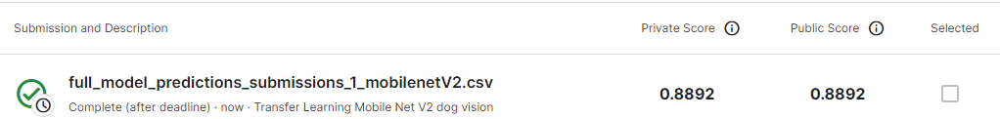

## Making predicitions of custom images

To make predictions on custom images:
* Get filepaths of our images
* Turn the filepaths into data batches using create_data_batches(). Since they wont have labels , we set test_data parameter to `True`
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediciton output probabilties to predictions labels
* Compare the predicted labels to custom images

In [ ]:
# Get Custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/custom images pred/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/custom images pred/customimage3.jpg',
 '/content/drive/MyDrive/Dog Vision/custom images pred/customimage2.jpg',
 '/content/drive/MyDrive/Dog Vision/custom images pred/customimage1.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data= True)
custom_data

Creating tets data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predicitons on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image predicitons labels

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'pomeranian', 'blenheim_spaniel']

In [ ]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)



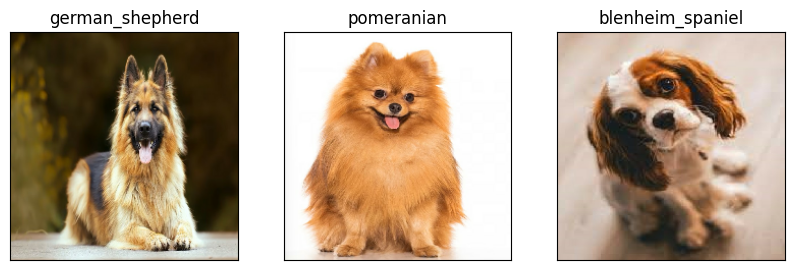

In [ ]:
# Check custom image predicitons
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)


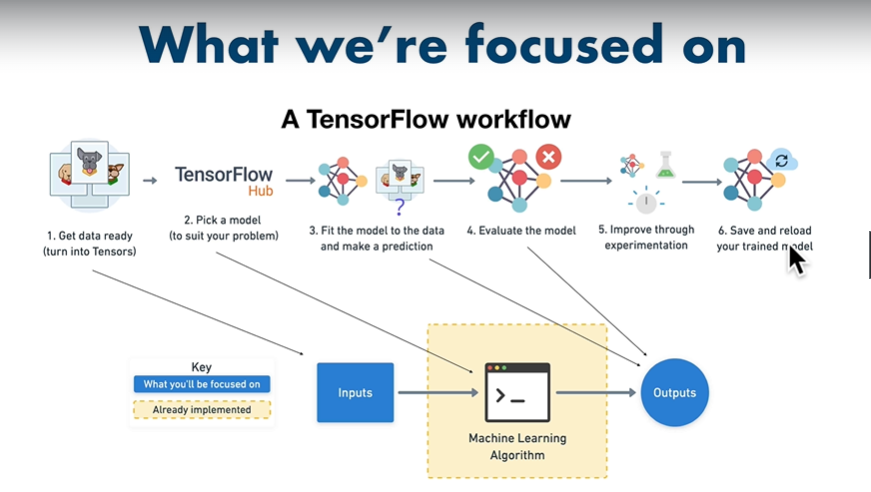